In [3]:
import os
import torch
os.environ['TORCH'] = torch.__version__
from torch_geometric.data import Data
from torch_geometric.nn import GATv2Conv

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

Dataframe_Labels = pd.read_csv("../BLCA_DATA/Workspace/labels_str.csv")
Dataframe_link = pd.read_csv("../BLCA_DATA/Workspace/patient_norm.csv")
Dataframe_node= pd.read_csv("../BLCA_DATA/Workspace/node_embedding.csv")

Dataframe_Labels['class_int'], uniques = pd.factorize(Dataframe_Labels['class'])

classes_dict = {0: 'LumP', 
                1: 'Ba/Sq', 
                2: 'LumU', 
                3: 'Stroma-rich', 
                4: 'LumNS', 
                5: 'NE-like'
}

def count_classes_weights(tensor):
    array = tensor.numpy()
    classes_tab = { 0: 0, 
                    1: 0,
                    2: 0, 
                    3: 0, 
                    4: 0,
                    5: 0
    }
    for i in array:
        classes_tab[i]+=1

    mean_nb_classes = 0
    for i in classes_tab:
        mean_nb_classes += i
    mean_nb_classes *= 1/len(classes_tab)
    
    # normalize the weights
    weight_sum = 0
    for i in range(len(classes_tab)):
        if classes_tab[i] != 0:
            weight_sum += mean_nb_classes / classes_tab[i]
    alpha = 1 / weight_sum

    weight_dict = {}
    used_classes = []
    for i in range(len(classes_tab)):
        if classes_tab[i] != 0:
            weight_dict[i] = alpha * (mean_nb_classes / classes_tab[i]) *50
            used_classes.append(classes_dict[i])

    return used_classes, weight_dict

from sklearn.model_selection import train_test_split

node_features = Dataframe_node.drop(columns=['Patient']).values
node_features = torch.tensor(node_features, dtype=torch.float)

train_val_indices = [i for i in range(node_features.shape[0])]
_, test_indices = train_test_split(
    range(len(node_features)), 
    test_size=0.2, 
    random_state=1234
)

x_train = node_features[train_val_indices]
x_test = node_features[test_indices]

patient_similarity = cosine_similarity(Dataframe_link.iloc[:, 1:])
similarity_threshold = 0.5  # Exemple de seuil de similarité

# Calculate the edges and attention ridges for training
edge_index_for_training = []
edge_attr_for_training = []
re_indexed_i = 0
re_indexed_j = 0
for i in range(len(train_val_indices)):
    for j in range(i+1, len(train_val_indices)):
        if patient_similarity[i, j] > similarity_threshold:
            edge_index_for_training.append([re_indexed_i, re_indexed_j])
            edge_attr_for_training.append((patient_similarity[i, j] - similarity_threshold)/(1 - similarity_threshold))
        re_indexed_j +=1
    re_indexed_i +=1
    re_indexed_j = 0

# Calculate the edges and attention ridges for testing
edge_index_for_testing = []
edge_attr_for_testing = []
re_indexed_i = 0
re_indexed_j = 0
for i in test_indices:
    for j in test_indices:
        if i >= j :
            break
        if patient_similarity[i, j] > similarity_threshold:
            edge_index_for_testing.append([re_indexed_i, re_indexed_j])
            edge_attr_for_testing.append((patient_similarity[i, j] - similarity_threshold)/(1 - similarity_threshold))
        re_indexed_j +=1
    re_indexed_i +=1
    re_indexed_j = 0

node_labels = Dataframe_Labels["class_int"].values
train_labels = torch.tensor(node_labels[train_val_indices], dtype=torch.long)
test_labels = torch.tensor(node_labels[test_indices], dtype=torch.long)

node_labels = torch.tensor(node_labels, dtype=torch.long)

used_classes, weight_dict = count_classes_weights(node_labels)
Dataframe_Labels['weight'] = [weight_dict[x] for x in Dataframe_Labels['class_int']]
node_weights = torch.tensor(Dataframe_Labels['weight'], dtype=torch.float)

edge_features_for_training = torch.tensor(x_train, dtype=torch.float)
edge_index_for_training = torch.tensor(edge_index_for_training, dtype=torch.int64).t().contiguous()
edge_attr_for_training = torch.tensor(edge_attr_for_training, dtype=torch.float)
node_weights_for_training = node_weights[train_val_indices]

edge_features_for_testing = torch.tensor(x_test, dtype=torch.float)
edge_index_for_testing = torch.tensor(edge_index_for_testing, dtype=torch.int64).t().contiguous()
edge_attr_for_testing = torch.tensor(edge_attr_for_testing, dtype=torch.float)
node_weights_for_testing = node_weights[test_indices]

num_classes = 6
test_mask = torch.zeros(len(edge_features_for_training), dtype=torch.bool)
test_mask[test_indices] = True

train_val_data = Data(
    x=edge_features_for_training, 
    edge_index=edge_index_for_training, 
    edge_attr=edge_attr_for_training, 
    y=train_labels, 
    weights=node_weights_for_training, 
    num_classes=num_classes,
    num_nodes = len(edge_features_for_training),
    num_features = edge_features_for_training.shape[1],
    test_mask = test_mask
)

test_data = Data(
    x=edge_features_for_testing, 
    edge_index=edge_index_for_testing, 
    edge_attr=edge_attr_for_testing, 
    y=test_labels, 
    weights=node_weights_for_testing, 
    num_classes=num_classes, 
    num_nodes = len(edge_features_for_testing),
    num_features = edge_features_for_testing.shape[1]
    )

/tmp/ipykernel_4421/47490617.py:119: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  edge_features_for_training = torch.tensor(x_train, dtype=torch.float)
/tmp/ipykernel_4421/47490617.py:124: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  edge_features_for_testing = torch.tensor(x_test, dtype=torch.float)


In [4]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv
import optuna
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
storage = {}
class GATv2(torch.nn.Module):
    def __init__(self, hidden_channels, heads, data):
        super(GATv2, self).__init__()
        torch.manual_seed(1234)
        self.convs = torch.nn.ModuleList()
        self.convs.append(GATv2Conv(data.num_features, hidden_channels, heads=heads, edge_dim=1))
        self.convs.append(GATv2Conv(hidden_channels * heads, data.num_classes, edge_dim=1))
        
    def forward(self, x, edge_index, edge_attr):
        for conv in self.convs[:-1]:
            x = F.dropout(x, p=0.6, training=self.training)
            x = conv(x, edge_index, edge_attr)
            x = F.elu(x)
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.convs[-1](x, edge_index, edge_attr)
        return x

def weighted_cross_entropy_loss(output, target, weights):
    loss = F.cross_entropy(output, target, reduction='none')
    weighted_loss = loss * weights[target]
    return weighted_loss.mean()

def train(model, data, optimizer):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index, data.edge_attr)
    loss = weighted_cross_entropy_loss(out[data.train_mask], data.y[data.train_mask], data.weights[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss

def test(model, data, mask):
    model.eval()
    out = model(data.x, data.edge_index, data.edge_attr)
    pred = out.argmax(dim=1)
    correct = pred[mask] == data.y[mask]
    acc = int(correct.sum()) / int(mask.sum())
    return acc, pred[mask]

def dinstinction(data):
    train_val_indexes = torch.ones(data.num_nodes, dtype=torch.bool)
    for i in range(len(train_val_indexes)):
        if data.test_mask[i]:
            train_val_indexes[i] = False

    X=data.x[train_val_indexes]
    Y=data.y[train_val_indexes]
    return(X,Y)

def objective(trial, data = train_val_data, test_data = test_data):
    # Hyperparameters to be optimized
    hidden_channels = trial.suggest_int('hidden_channels', 16, 30)
    heads = trial.suggest_int('heads', 1, 16)
    
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=1234)
    all_test_acc = []
    
    data_X_for_Val, data_Y_for_val  = dinstinction(data)

    for fold, (_, val_index) in enumerate(skf.split(data_X_for_Val, data_Y_for_val)):

        train_index = [i for i in range(data.num_nodes)]
        data.train_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
        data.train_mask[train_index] = True
        
        data.val_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
        data.val_mask[val_index] = True
        
        # Initialize model, optimizer, and loss function
        model = GATv2(hidden_channels=hidden_channels, heads=heads, data=data)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)

        # Training loop
        for epoch in range(1, 1500):
            loss = train(model, data, optimizer)
            val_acc, _ = test(model, data, data.val_mask)
            train_acc, _ = test(model, data, data.train_mask)
            print(f'Fold: {fold + 1}, Epoch: {epoch:03d}, Loss: {loss:.4f}, Train {train_acc:.4f}, Val {val_acc:.4f}')

        # Evaluate on test set   
        test_mask = torch.ones(test_data.num_nodes, dtype=torch.bool)
        test_acc, _ = test(model, test_data, test_mask)

        # Store results
        all_test_acc.append(test_acc)

    # Calculate mean test accuracy for all folds
    mean_test_acc = np.mean(all_test_acc)
    storage[trial.number] = {"values": mean_test_acc, "heads": heads, "hidden_channels": hidden_channels}
    return mean_test_acc

# Run the optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=20)

# Print the best parameters
print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

print(storage)

[I 2024-07-15 23:48:40,005] A new study created in memory with name: no-name-fbb28896-a30a-457e-8b81-b5d328eb6061


Fold: 1, Epoch: 001, Loss: 3.1959, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 2.2900, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 2.8907, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 2.4382, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 2.3251, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.4603, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 2.4368, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.4968, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.4148, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.3409, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.3209, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.3205, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.3978, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.3273, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.2330, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.1947, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 017, Loss: 2.1773, Train

[I 2024-07-15 23:55:48,058] Trial 0 finished with value: 0.2962962962962963 and parameters: {'hidden_channels': 26, 'heads': 3}. Best is trial 0 with value: 0.2962962962962963.


Fold: 1, Epoch: 001, Loss: 2.9121, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 002, Loss: 2.9165, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 2.9499, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 2.5224, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 005, Loss: 2.5204, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 006, Loss: 2.7531, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 007, Loss: 2.5608, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.5783, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.6737, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.4210, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.5812, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.4187, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 013, Loss: 2.3533, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 014, Loss: 2.3331, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.3930, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.3342, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 017, Loss: 2.3492, Train

[I 2024-07-16 00:21:35,324] Trial 1 finished with value: 0.345679012345679 and parameters: {'hidden_channels': 23, 'heads': 8}. Best is trial 1 with value: 0.345679012345679.


Fold: 5, Epoch: 1499, Loss: 0.2699, Train 0.9901, Val 1.0000
Fold: 1, Epoch: 001, Loss: 2.3750, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 8.1079, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 4.0405, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 004, Loss: 5.2549, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 005, Loss: 4.8284, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 006, Loss: 3.4465, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 007, Loss: 2.8991, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.5975, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 3.0908, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 3.1407, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 3.1352, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 3.1817, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.8515, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.3862, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.3879, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.4959, Trai

[I 2024-07-16 01:19:38,082] Trial 2 finished with value: 0.5802469135802469 and parameters: {'hidden_channels': 30, 'heads': 15}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1499, Loss: 0.2747, Train 0.7995, Val 0.8594
Fold: 1, Epoch: 001, Loss: 2.2239, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 3.9218, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 5.4620, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 004, Loss: 5.3601, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 005, Loss: 2.9986, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.8371, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 3.2581, Train 0.1089, Val 0.0615
Fold: 1, Epoch: 008, Loss: 3.3733, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 009, Loss: 3.1704, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 010, Loss: 3.3650, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 011, Loss: 3.1942, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 3.0008, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.9221, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.6332, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.5059, Train 0.0520, Val 0.0615
Fold: 1, Epoch: 016, Loss: 2.3709, Trai

[I 2024-07-16 02:09:37,006] Trial 3 finished with value: 0.35802469135802467 and parameters: {'hidden_channels': 29, 'heads': 13}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1499, Loss: 0.1844, Train 0.7550, Val 0.7812
Fold: 1, Epoch: 001, Loss: 2.6441, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 4.9363, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 2.6616, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 004, Loss: 3.4850, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 005, Loss: 3.3916, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 006, Loss: 2.6001, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 2.5633, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.8775, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.9363, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.5831, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 011, Loss: 2.6133, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.4140, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 013, Loss: 2.2806, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 014, Loss: 2.2386, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 015, Loss: 2.3459, Train 0.1411, Val 0.1385
Fold: 1, Epoch: 016, Loss: 2.2691, Trai

[I 2024-07-16 02:45:06,983] Trial 4 finished with value: 0.5308641975308642 and parameters: {'hidden_channels': 26, 'heads': 10}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1499, Loss: 0.1926, Train 0.9084, Val 0.9219
Fold: 1, Epoch: 001, Loss: 2.9249, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 2.2034, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 2.4723, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 2.2974, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 2.5027, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.5960, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 2.4005, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.4303, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.4286, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.5554, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.4119, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.4678, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.3923, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.3304, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.3640, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.3691, Trai

[I 2024-07-16 02:52:20,103] Trial 5 finished with value: 0.4814814814814815 and parameters: {'hidden_channels': 20, 'heads': 4}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1498, Loss: 0.2266, Train 0.9233, Val 0.9688
Fold: 5, Epoch: 1499, Loss: 0.2497, Train 0.9381, Val 0.9844
Fold: 1, Epoch: 001, Loss: 2.6318, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 002, Loss: 5.4608, Train 0.1337, Val 0.1385
Fold: 1, Epoch: 003, Loss: 3.3197, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 2.9164, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 3.7918, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 3.1001, Train 0.1089, Val 0.0615
Fold: 1, Epoch: 007, Loss: 2.4963, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 008, Loss: 2.7575, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 009, Loss: 2.9815, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 010, Loss: 2.5297, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.3259, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.3408, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.5021, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.5161, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.2968, Tra

[I 2024-07-16 03:28:07,841] Trial 6 finished with value: 0.5185185185185185 and parameters: {'hidden_channels': 22, 'heads': 12}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1499, Loss: 0.2637, Train 0.7129, Val 0.7812
Fold: 1, Epoch: 001, Loss: 2.9176, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 2.2942, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 2.3101, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 2.2902, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 2.2542, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.2584, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 2.1922, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.2830, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.2557, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.2198, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.1535, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.2081, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.1897, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.1950, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.1659, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.2740, Trai

[I 2024-07-16 03:30:26,586] Trial 7 finished with value: 0.4691358024691358 and parameters: {'hidden_channels': 24, 'heads': 1}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1493, Loss: 0.4713, Train 0.6436, Val 0.7188
Fold: 5, Epoch: 1494, Loss: 0.4866, Train 0.6436, Val 0.7188
Fold: 5, Epoch: 1495, Loss: 0.4202, Train 0.6436, Val 0.7188
Fold: 5, Epoch: 1496, Loss: 0.4943, Train 0.6436, Val 0.7188
Fold: 5, Epoch: 1497, Loss: 0.4718, Train 0.6535, Val 0.7188
Fold: 5, Epoch: 1498, Loss: 0.4542, Train 0.6634, Val 0.7344
Fold: 5, Epoch: 1499, Loss: 0.3966, Train 0.6609, Val 0.7344
Fold: 1, Epoch: 001, Loss: 2.8351, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 002, Loss: 3.1985, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 5.3454, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 4.4540, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 005, Loss: 3.6017, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 006, Loss: 3.8642, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 007, Loss: 3.6183, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 008, Loss: 2.8164, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.7983, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 3.2309

[I 2024-07-16 04:20:17,881] Trial 8 finished with value: 0.49382716049382713 and parameters: {'hidden_channels': 25, 'heads': 15}. Best is trial 2 with value: 0.5802469135802469.


Fold: 5, Epoch: 1499, Loss: 0.1027, Train 0.9827, Val 0.9688
Fold: 1, Epoch: 001, Loss: 3.0670, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 4.2348, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 5.0277, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 004, Loss: 4.4824, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 4.7658, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 3.9560, Train 0.3762, Val 0.3538
Fold: 1, Epoch: 007, Loss: 3.8743, Train 0.3762, Val 0.3538
Fold: 1, Epoch: 008, Loss: 3.4676, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.8464, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.6323, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.3606, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 012, Loss: 2.8096, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 013, Loss: 2.7668, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 014, Loss: 2.4381, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.4353, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.4632, Trai

[I 2024-07-16 05:21:59,829] Trial 9 finished with value: 0.8395061728395061 and parameters: {'hidden_channels': 30, 'heads': 16}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.2423, Train 0.9035, Val 0.9062
Fold: 1, Epoch: 001, Loss: 2.8190, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 2.2339, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 2.3815, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 2.4307, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 2.4937, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.5174, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 2.6256, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 2.4611, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.3985, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.4076, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.3268, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.3710, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.2592, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.2668, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.2490, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.1474, Trai

[I 2024-07-16 05:31:50,997] Trial 10 finished with value: 0.49382716049382713 and parameters: {'hidden_channels': 16, 'heads': 7}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.2097, Train 0.7599, Val 0.7188
Fold: 1, Epoch: 001, Loss: 3.0670, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 4.2348, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 5.0277, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 004, Loss: 4.4824, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 4.7658, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 3.9560, Train 0.3762, Val 0.3538
Fold: 1, Epoch: 007, Loss: 3.8743, Train 0.3762, Val 0.3538
Fold: 1, Epoch: 008, Loss: 3.4676, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 2.8464, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.6323, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.3606, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 012, Loss: 2.8096, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 013, Loss: 2.7668, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 014, Loss: 2.4381, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.4353, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.4632, Trai

[I 2024-07-16 06:33:58,753] Trial 11 finished with value: 0.8395061728395061 and parameters: {'hidden_channels': 30, 'heads': 16}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.2423, Train 0.9035, Val 0.9062
Fold: 1, Epoch: 001, Loss: 2.9045, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 4.5727, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 5.7037, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 004, Loss: 3.5960, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 005, Loss: 3.6003, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 006, Loss: 4.0745, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 007, Loss: 4.0497, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 3.0409, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 009, Loss: 2.7087, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 010, Loss: 3.3230, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 011, Loss: 2.9727, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.7811, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 3.1631, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.7741, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 015, Loss: 2.4512, Train 0.3119, Val 0.3692
Fold: 1, Epoch: 016, Loss: 2.2971, Trai

[I 2024-07-16 07:34:05,981] Trial 12 finished with value: 0.6419753086419753 and parameters: {'hidden_channels': 29, 'heads': 16}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.2636, Train 0.9752, Val 0.9844
Fold: 1, Epoch: 001, Loss: 3.1328, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 002, Loss: 3.3242, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 5.2522, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 004, Loss: 4.1668, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 005, Loss: 4.9232, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 006, Loss: 4.8057, Train 0.0495, Val 0.0615
Fold: 1, Epoch: 007, Loss: 3.8778, Train 0.0520, Val 0.0615
Fold: 1, Epoch: 008, Loss: 3.5329, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 3.5784, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 3.3483, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.5707, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.4279, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 013, Loss: 2.4828, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 014, Loss: 2.6865, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 015, Loss: 2.9838, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 016, Loss: 2.4927, Trai

[I 2024-07-16 08:20:31,953] Trial 13 finished with value: 0.4691358024691358 and parameters: {'hidden_channels': 28, 'heads': 12}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.1941, Train 0.5891, Val 0.6094
Fold: 1, Epoch: 001, Loss: 2.3103, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 5.2880, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 8.2541, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 004, Loss: 4.9401, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 2.7906, Train 0.1337, Val 0.1385
Fold: 1, Epoch: 006, Loss: 3.8733, Train 0.1089, Val 0.0615
Fold: 1, Epoch: 007, Loss: 4.4493, Train 0.1089, Val 0.0615
Fold: 1, Epoch: 008, Loss: 4.4306, Train 0.1460, Val 0.1385
Fold: 1, Epoch: 009, Loss: 3.5486, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.8510, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.2396, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.9047, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 013, Loss: 3.3664, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 014, Loss: 2.7685, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.5098, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.6491, Trai

[I 2024-07-16 09:23:24,084] Trial 14 finished with value: 0.5555555555555556 and parameters: {'hidden_channels': 27, 'heads': 16}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.2061, Train 0.7673, Val 0.7188
Fold: 1, Epoch: 001, Loss: 3.4400, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 3.6428, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 5.4960, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 4.1871, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 3.9675, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.9640, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 007, Loss: 3.3127, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 008, Loss: 3.2938, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 009, Loss: 2.8691, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.2064, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.4100, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.6190, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.5688, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.3610, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.5179, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.5774, Trai

[I 2024-07-16 10:23:37,201] Trial 15 finished with value: 0.6049382716049383 and parameters: {'hidden_channels': 30, 'heads': 13}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.2007, Train 0.9975, Val 1.0000
Fold: 1, Epoch: 001, Loss: 4.2043, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 2.4177, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 3.0564, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 3.1744, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 2.6996, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 006, Loss: 2.8318, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 007, Loss: 2.8730, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 008, Loss: 2.5616, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 009, Loss: 2.6304, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 010, Loss: 2.5868, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 011, Loss: 2.5136, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 012, Loss: 2.4920, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.4602, Train 0.3762, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.4033, Train 0.3762, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.4411, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.3240, Trai

[I 2024-07-16 10:54:46,402] Trial 16 finished with value: 0.7777777777777778 and parameters: {'hidden_channels': 20, 'heads': 10}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.3366, Train 0.9653, Val 0.9688
Fold: 1, Epoch: 001, Loss: 3.5703, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 002, Loss: 2.8917, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 003, Loss: 3.9004, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 004, Loss: 3.4635, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 005, Loss: 3.9323, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 006, Loss: 3.6412, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 3.2144, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 008, Loss: 3.2263, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 009, Loss: 3.0269, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 010, Loss: 2.6188, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 011, Loss: 2.3162, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.3044, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 013, Loss: 2.3499, Train 0.1312, Val 0.1385
Fold: 1, Epoch: 014, Loss: 2.4415, Train 0.1337, Val 0.1385
Fold: 1, Epoch: 015, Loss: 2.5232, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 016, Loss: 2.3265, Trai

[I 2024-07-16 11:29:59,689] Trial 17 finished with value: 0.8024691358024691 and parameters: {'hidden_channels': 16, 'heads': 14}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.1816, Train 0.7970, Val 0.7188
Fold: 1, Epoch: 001, Loss: 3.0029, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 2.5648, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 3.7281, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 004, Loss: 2.7487, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 3.1091, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 006, Loss: 2.9982, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 007, Loss: 2.4647, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 008, Loss: 2.4846, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 009, Loss: 2.8678, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 010, Loss: 2.7630, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 011, Loss: 2.4400, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.3672, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.3721, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.5375, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.4054, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 016, Loss: 2.3209, Trai

[I 2024-07-16 11:45:19,430] Trial 18 finished with value: 0.49382716049382713 and parameters: {'hidden_channels': 28, 'heads': 6}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1498, Loss: 0.1983, Train 0.8713, Val 0.9219
Fold: 5, Epoch: 1499, Loss: 0.2522, Train 0.8119, Val 0.8281
Fold: 1, Epoch: 001, Loss: 3.0880, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 002, Loss: 3.9255, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 003, Loss: 5.6283, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 004, Loss: 3.7969, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 005, Loss: 3.2999, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 006, Loss: 3.2901, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 007, Loss: 3.2053, Train 0.1114, Val 0.0615
Fold: 1, Epoch: 008, Loss: 3.4744, Train 0.1337, Val 0.1385
Fold: 1, Epoch: 009, Loss: 3.4046, Train 0.3168, Val 0.3692
Fold: 1, Epoch: 010, Loss: 2.6665, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 011, Loss: 2.4565, Train 0.3144, Val 0.3692
Fold: 1, Epoch: 012, Loss: 2.6210, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 013, Loss: 2.7173, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 014, Loss: 2.9270, Train 0.3787, Val 0.3538
Fold: 1, Epoch: 015, Loss: 2.8282, Tra

[I 2024-07-16 12:31:44,165] Trial 19 finished with value: 0.5432098765432098 and parameters: {'hidden_channels': 30, 'heads': 10}. Best is trial 9 with value: 0.8395061728395061.


Fold: 5, Epoch: 1499, Loss: 0.3213, Train 0.8614, Val 0.8906
Best trial:
  Value:  0.8395061728395061
  Params: 
    hidden_channels: 30
    heads: 16
{0: {'values': 0.2962962962962963, 'heads': 3, 'hidden_channels': 26}, 1: {'values': 0.345679012345679, 'heads': 8, 'hidden_channels': 23}, 2: {'values': 0.5802469135802469, 'heads': 15, 'hidden_channels': 30}, 3: {'values': 0.35802469135802467, 'heads': 13, 'hidden_channels': 29}, 4: {'values': 0.5308641975308642, 'heads': 10, 'hidden_channels': 26}, 5: {'values': 0.4814814814814815, 'heads': 4, 'hidden_channels': 20}, 6: {'values': 0.5185185185185185, 'heads': 12, 'hidden_channels': 22}, 7: {'values': 0.4691358024691358, 'heads': 1, 'hidden_channels': 24}, 8: {'values': 0.49382716049382713, 'heads': 15, 'hidden_channels': 25}, 9: {'values': 0.8395061728395061, 'heads': 16, 'hidden_channels': 30}, 10: {'values': 0.49382716049382713, 'heads': 7, 'hidden_channels': 16}, 11: {'values': 0.8395061728395061, 'heads': 16, 'hidden_channels': 30

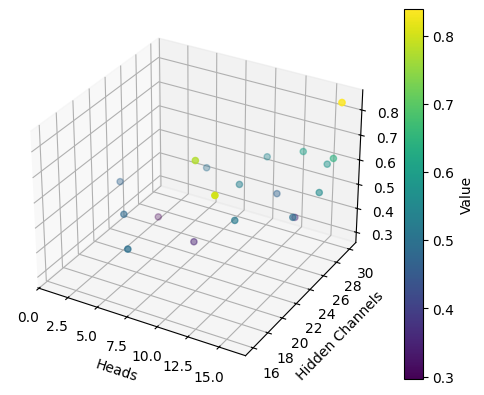

In [5]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Préparation des données pour le plot en 3D
heads = [storage[i]['heads'] for i in storage]
hidden_channels = [storage[i]['hidden_channels'] for i in storage]
values = [storage[i]['values'] for i in storage]

# Création du graphique en 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(heads, hidden_channels, values, c=values, cmap='viridis', marker='o')

ax.set_xlabel('Heads')
ax.set_ylabel('Hidden Channels')
ax.set_zlabel('Value')

plt.colorbar(sc, label='Value')
plt.show()